In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls -lah '/content/drive/MyDrive/normimg'

total 4.0K
drwx------ 2 root root 4.0K Apr  6 19:08 JPEGImages


In [ ]:
!ls -lah '/content/drive/MyDrive/mskdimg'

total 4.0K
drwx------ 2 root root 4.0K Apr  6 18:43 Annotations


In [ ]:
!pip install tf-explain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 928.9 kB/s eta 0:00:00


In [ ]:
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf

import tensorflow.data as tfd
import tensorflow.image as tfi
from tensorflow.keras.utils import load_img, img_to_array

import matplotlib.pyplot as plt

from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Concatenate
from keras.layers import UpSampling2D
from keras.layers import AveragePooling2D
from keras.models import Sequential, Model
from keras.layers import BatchNormalization

from tensorflow.keras.applications import ResNet50

from keras.callbacks import Callback, ModelCheckpoint

from tensorflow.keras.utils import plot_model

from tf_explain.core.grad_cam import GradCAM


In [ ]:
subdirs = [x[0] for x in os.walk("/content/drive/MyDrive/normimg/JPEGImages/")]
subdirs[1:]

['/content/drive/MyDrive/normimg/JPEGImages/holiday_inn_clip0',
 '/content/drive/MyDrive/normimg/JPEGImages/stream0',
 '/content/drive/MyDrive/normimg/JPEGImages/mexico_beach_clip0',
 '/content/drive/MyDrive/normimg/JPEGImages/keswick_greta',
 '/content/drive/MyDrive/normimg/JPEGImages/holmrook',
 '/content/drive/MyDrive/normimg/JPEGImages/river_segs',
 '/content/drive/MyDrive/normimg/JPEGImages/worcester',
 '/content/drive/MyDrive/normimg/JPEGImages/stream3_small',
 '/content/drive/MyDrive/normimg/JPEGImages/stream2',
 '/content/drive/MyDrive/normimg/JPEGImages/stream1',
 '/content/drive/MyDrive/normimg/JPEGImages/cockermouth',
 '/content/drive/MyDrive/normimg/JPEGImages/buffalo0_small',
 '/content/drive/MyDrive/normimg/JPEGImages/dublin',
 '/content/drive/MyDrive/normimg/JPEGImages/bewdley',
 '/content/drive/MyDrive/normimg/JPEGImages/gulf_crest',
 '/content/drive/MyDrive/normimg/JPEGImages/galway-city',
 '/content/drive/MyDrive/normimg/JPEGImages/evesham-lock',
 '/content/drive/MyDr

In [ ]:
subdirs_2 = [x[0] for x in os.walk("/content/drive/MyDrive/mskdimg/Annotations/")]
subdirs_2[1:]


['/content/drive/MyDrive/mskdimg/Annotations/holmrook',
 '/content/drive/MyDrive/mskdimg/Annotations/stream1',
 '/content/drive/MyDrive/mskdimg/Annotations/stream3_small',
 '/content/drive/MyDrive/mskdimg/Annotations/stream0',
 '/content/drive/MyDrive/mskdimg/Annotations/stream2',
 '/content/drive/MyDrive/mskdimg/Annotations/stream2/12_00_json',
 '/content/drive/MyDrive/mskdimg/Annotations/river_segs',
 '/content/drive/MyDrive/mskdimg/Annotations/mexico_beach_clip0',
 '/content/drive/MyDrive/mskdimg/Annotations/keswick_greta',
 '/content/drive/MyDrive/mskdimg/Annotations/worcester',
 '/content/drive/MyDrive/mskdimg/Annotations/holiday_inn_clip0',
 '/content/drive/MyDrive/mskdimg/Annotations/boston_harbor2_small_rois',
 '/content/drive/MyDrive/mskdimg/Annotations/bewdley',
 '/content/drive/MyDrive/mskdimg/Annotations/cockermouth',
 '/content/drive/MyDrive/mskdimg/Annotations/dublin',
 '/content/drive/MyDrive/mskdimg/Annotations/buffalo0_small',
 '/content/drive/MyDrive/mskdimg/Annotatio

In [ ]:
# Directories to remove
dirs_to_remove = ['/content/drive/MyDrive/mskdimg/Annotations/stream2/12_00_json']

# Remove specified directories from subdirs_2 list
subdirs_2 = [dir_path for dir_path in subdirs_2 if dir_path not in dirs_to_remove]

# Print updated subdirs_2 list
print(subdirs_2)


['/content/drive/MyDrive/mskdimg/Annotations/', '/content/drive/MyDrive/mskdimg/Annotations/holmrook', '/content/drive/MyDrive/mskdimg/Annotations/stream1', '/content/drive/MyDrive/mskdimg/Annotations/stream3_small', '/content/drive/MyDrive/mskdimg/Annotations/stream0', '/content/drive/MyDrive/mskdimg/Annotations/stream2', '/content/drive/MyDrive/mskdimg/Annotations/river_segs', '/content/drive/MyDrive/mskdimg/Annotations/mexico_beach_clip0', '/content/drive/MyDrive/mskdimg/Annotations/keswick_greta', '/content/drive/MyDrive/mskdimg/Annotations/worcester', '/content/drive/MyDrive/mskdimg/Annotations/holiday_inn_clip0', '/content/drive/MyDrive/mskdimg/Annotations/boston_harbor2_small_rois', '/content/drive/MyDrive/mskdimg/Annotations/bewdley', '/content/drive/MyDrive/mskdimg/Annotations/cockermouth', '/content/drive/MyDrive/mskdimg/Annotations/dublin', '/content/drive/MyDrive/mskdimg/Annotations/buffalo0_small', '/content/drive/MyDrive/mskdimg/Annotations/evesham-lock', '/content/drive/

In [ ]:
image_paths = []

jpeg_images_dir = "/content/drive/MyDrive/normimg/JPEGImages/"
for subdir in os.listdir(jpeg_images_dir):
    subdir_path = os.path.join(jpeg_images_dir, subdir)
    if os.path.isdir(subdir_path):
        for filename in os.listdir(subdir_path):
            if filename.endswith('.bmp'):
                image_paths.append(os.path.join(subdir_path, filename))

mask_paths = []

annotations_dir = "/content/drive/MyDrive/mskdimg/Annotations/"
for subdir in os.listdir(annotations_dir):
    subdir_path = os.path.join(annotations_dir, subdir)
    if os.path.isdir(subdir_path):
        for filename in os.listdir(subdir_path):
            if filename.endswith('.bmp'):
                mask_paths.append(os.path.join(subdir_path, filename))

print("Number of image paths:", len(image_paths))
print("Number of mask paths:", len(mask_paths))

Number of image paths: 2400
Number of mask paths: 2400


In [ ]:
mask_paths[0]

'/content/drive/MyDrive/mskdimg/Annotations/holmrook/2019-08-03-13-00-10.bmp'

In [ ]:
image_paths[0]

'/content/drive/MyDrive/normimg/JPEGImages/holiday_inn_clip0/Holiday_Inn_09-10-2018-17-02-42_0.bmp'

In [ ]:
mask_paths.sort()
image_paths.sort()

In [ ]:
mask_paths[:15]

['/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000004.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000191.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000407.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000555.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000556.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000567.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000568.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000569.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000583.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000585.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000591.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000650.bmp',
 '/content/drive/MyDrive/mskdimg/Annotations/ADE20K/ADE_train_00000863.bmp',

In [ ]:
  image_paths[:15]

['/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000004.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000191.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000407.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000555.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000556.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000567.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000568.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000569.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000583.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000585.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000591.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000650.bmp',
 '/content/drive/MyDrive/normimg/JPEGImages/ADE20K/ADE_train_00000863.bmp',
 '/content/d

In [ ]:
def extract_numeric_part(filename):
    parts = filename.split("/")[-1].split("_")[-1].split(".")[0]
    numeric_part = ''.join(filter(str.isdigit, parts))
    return int(numeric_part)

images = sorted(image_paths, key=lambda x: extract_numeric_part(x))
masks = sorted(mask_paths, key=lambda x: extract_numeric_part(x))

len(images), len(masks)

(2400, 2400)

In [ ]:
import pandas as pd
df = pd.DataFrame(columns=['path', 'mask_path', 'class'])
df['path'] = images
df['mask_path'] = masks
df['class'] = 1
df.head(10)

,path,mask_path,class
0,/content/drive/MyDrive/normimg/JPEGImages/gulf...,/content/drive/MyDrive/mskdimg/Annotations/gul...,1
1,/content/drive/MyDrive/normimg/JPEGImages/gulf...,/content/drive/MyDrive/mskdimg/Annotations/gul...,1
2,/content/drive/MyDrive/normimg/JPEGImages/gulf...,/content/drive/MyDrive/mskdimg/Annotations/gul...,1
3,/content/drive/MyDrive/normimg/JPEGImages/gulf...,/content/drive/MyDrive/mskdimg/Annotations/gul...,1
4,/content/drive/MyDrive/normimg/JPEGImages/gulf...,/content/drive/MyDrive/mskdimg/Annotations/gul...,1
5,/content/drive/MyDrive/normimg/JPEGImages/holi...,/content/drive/MyDrive/mskdimg/Annotations/hol...,1
6,/content/drive/MyDrive/normimg/JPEGImages/holi...,/content/drive/MyDrive/mskdimg/Annotations/hol...,1
7,/content/drive/MyDrive/normimg/JPEGImages/holi...,/content/drive/MyDrive/mskdimg/Annotations/hol...,1
8,/content/drive/MyDrive/normimg/JPEGImages/holi...,/content/drive/MyDrive/mskdimg/Annotations/hol...,1
9,/content/drive/MyDrive/normimg/JPEGImages/holi...,/content/drive/MyDrive/mskdimg/Annotations/hol...,1


In [ ]:
len(df)

2400

In [ ]:
d2 = df.iloc[:int(len(df)*0.85)]
test_set = df.iloc[int(len(df)*0.85):]

In [ ]:
import tensorflow as tf
import pandas as pd
img_size = [512, 512]

def data_augmentation(wtr_img, mask_img):
    if tf.random.uniform(()) > 0.5:
        wtr_img = tf.image.flip_left_right(wtr_img)
        mask_img = tf.image.flip_left_right(mask_img)

    return wtr_img, mask_img

def preprocessing(wtr_path, mask_path):
    wtr_img = tf.io.read_file(wtr_path)
    wtr_img = tf.image.decode_bmp(wtr_img, channels=3)
    wtr_img = tf.image.resize(wtr_img, img_size)
    wtr_img = tf.cast(wtr_img, tf.float32) / 255.0

    mask_img = tf.io.read_file(mask_path)
    mask_img = tf.image.decode_bmp(mask_img, channels=3)
    mask_img = tf.image.resize(mask_img, img_size)
    mask_img = mask_img[:, :, :1]
    mask_img = tf.math.sign(mask_img)

    return wtr_img, mask_img


def create_dataset(df, train=False):
    if not train:
        ds = tf.data.Dataset.from_tensor_slices((df["path"].values, df["mask_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
    else:
        ds = tf.data.Dataset.from_tensor_slices((df["path"].values, df["mask_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
        ds = ds.map(data_augmentation, tf.data.AUTOTUNE)

    return ds

In [ ]:
len(d2), len(test_set)

(2040, 360)

In [ ]:
from sklearn.model_selection import train_test_split
train_df, valid_df = train_test_split(d2, random_state=42, test_size=.25)
train = create_dataset(train_df, train = True)
valid = create_dataset(valid_df)
test = create_dataset(test_set)

In [ ]:
from keras import layers

In [ ]:
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    padding="same",
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.nn.relu(x)


def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

In [ ]:
IMAGE_SIZE = 512
BATCH_SIZE = 4
NUM_CLASSES = 2
TRAIN_LENGTH = len(train_df)


In [ ]:
def DeeplabV3Plus(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)
    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    return keras.Model(inputs=model_input, outputs=model_output)


model = DeeplabV3Plus(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
model.summary()

94765736/94765736 [==============================] - 3s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 518, 518, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 256, 256, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 256, 256, 64)         256       ['conv1_conv[0][0]']          
 on)                         

In [ ]:
def visualize(display_list):
    plt.figure(figsize=(12,12))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_predictions(sample_image, sample_mask):
    predictions = model.predict(np.expand_dims((sample_image), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    pred_mask = predictions
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    visualize([sample_image, sample_mask, pred_mask])

In [ ]:
import keras.backend as K

In [ ]:
BUFFER_SIZE = 1000
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
valid_dataset = valid.batch(BATCH_SIZE)
test_dataset = test.batch(BATCH_SIZE)

In [ ]:
test_dataset.take(123)

<_TakeDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 512, 512, 1), dtype=tf.float32, name=None))>

In [ ]:
def display(display_list):
    plt.figure(figsize=(12,12))
    title = ['Input Image','True Mask','Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

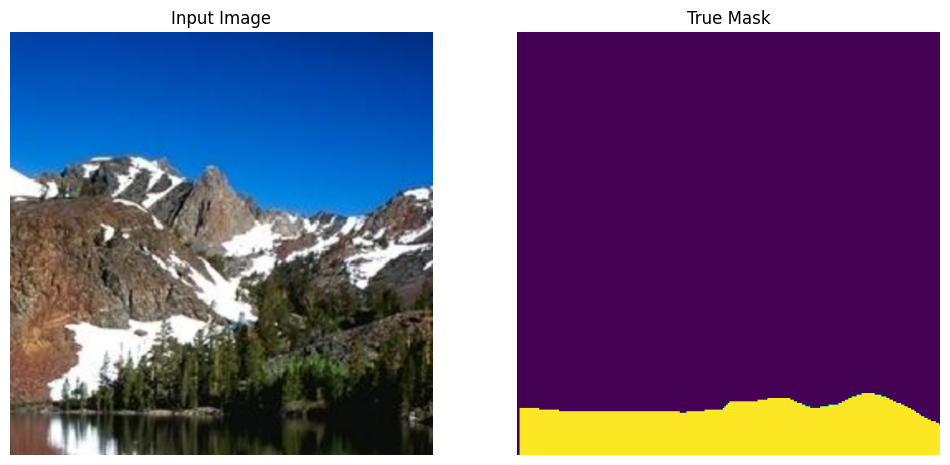

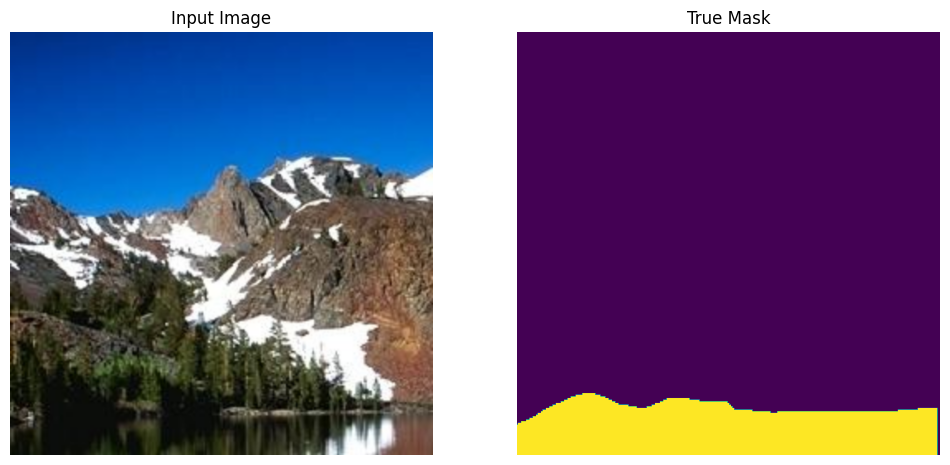

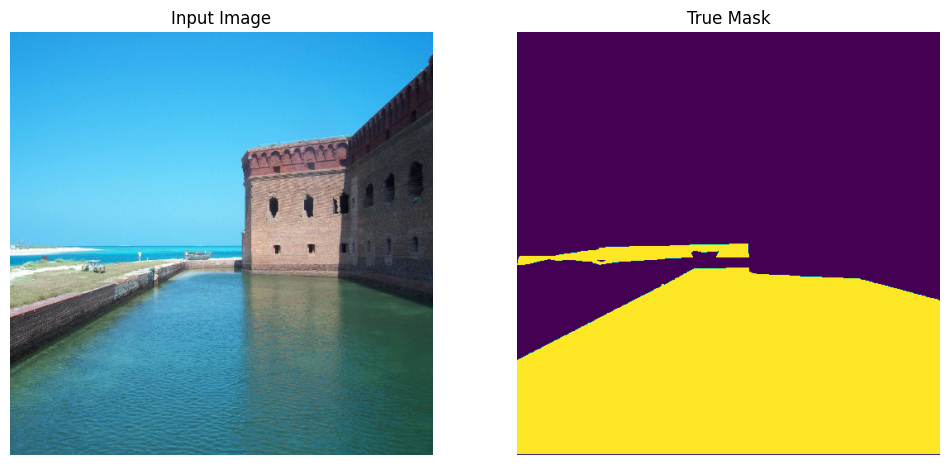

In [ ]:
for i in range(3):
    for image, mask in train.take(i):
        sample_image, sample_mask = image, mask
        display([sample_image, sample_mask])

In [ ]:
import matplotlib
def visualize(display_list):
    plt.figure(figsize=(12,12))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_prediction(sample_image):

    predictions = model.predict(np.expand_dims((sample_image), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    pred_mask = predictions
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    # visualize([sample_image, sample_mask, pred_mask])

    image = keras.utils.array_to_img(sample_image)
    image = np.array(sample_image).astype(np.uint8)
    # overlay = cv2.addWeighted(sample_image, 0.35, pred_mask, 0.65, 0)
    plt.figure(figsize=(6,6))
    cmap1 = matplotlib.colors.ListedColormap(['none', 'green'])
    cmap2 = matplotlib.colors.ListedColormap(['none', 'yellow'])
    plt.axis('off')
    plt.imshow(sample_image, cmap=cmap1)
    plt.imshow(pred_mask, cmap=cmap2, alpha=0.4)
    plt.show()


1/1 [==============================] - 4s 4s/step


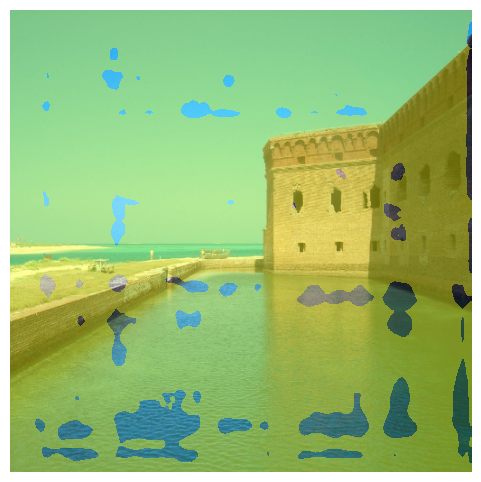

In [ ]:
show_prediction(sample_image)

1/1 [==============================] - 1s 1s/step


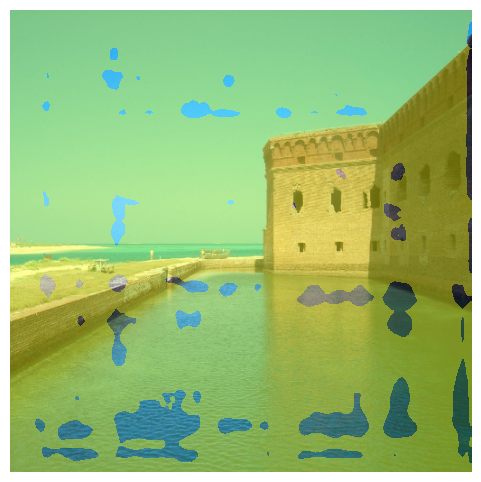

Epoch 1/30
1/1 [==============================] - 0s 56ms/step


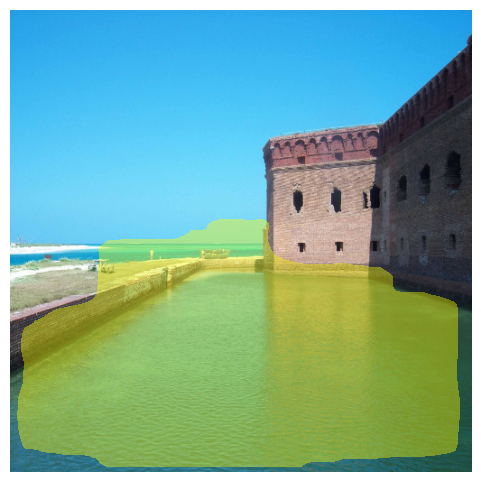

Epoch 2/30
1/1 [==============================] - 0s 31ms/step


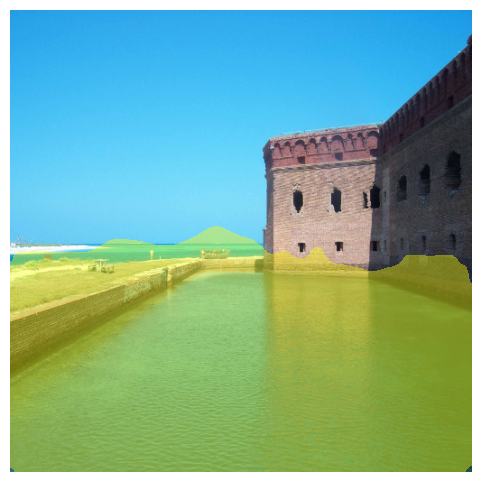

Epoch 3/30
1/1 [==============================] - 0s 31ms/step


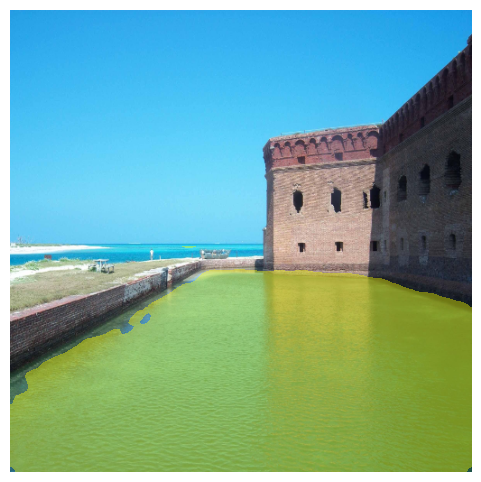

Epoch 4/30
1/1 [==============================] - 0s 33ms/step


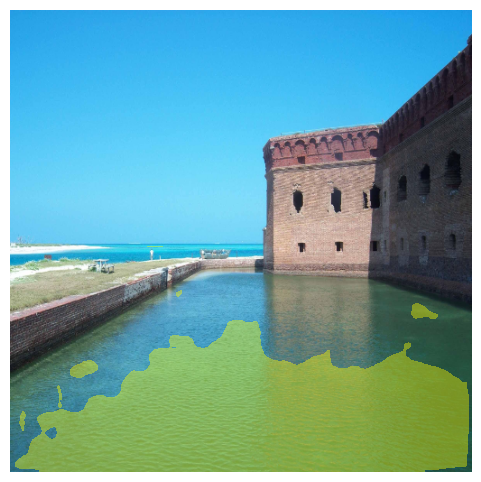

Epoch 5/30
1/1 [==============================] - 0s 46ms/step


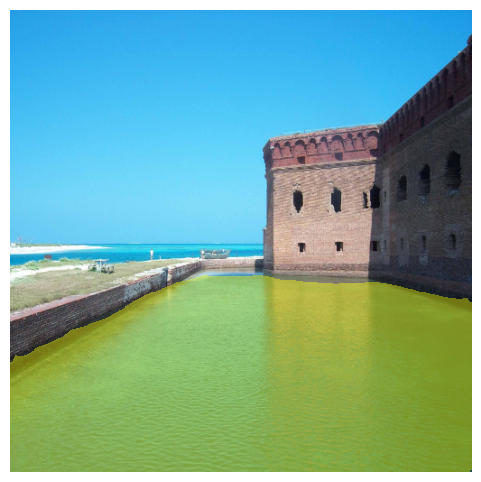

Epoch 6/30
1/1 [==============================] - 0s 51ms/step


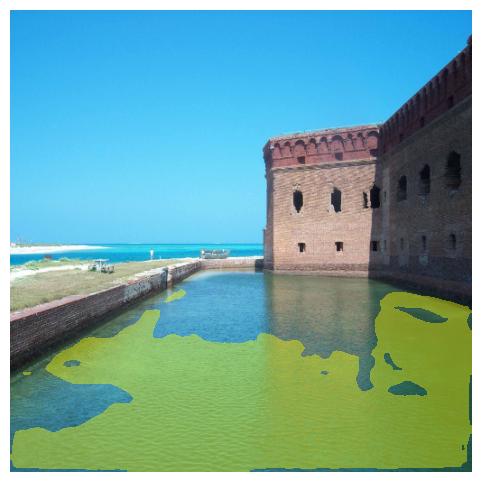

Epoch 7/30
1/1 [==============================] - 0s 39ms/step


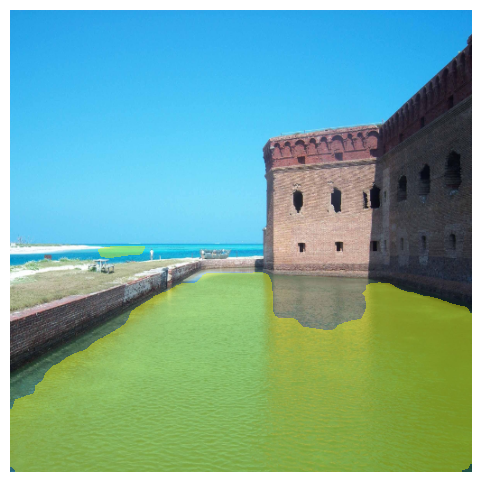

Epoch 8/30
1/1 [==============================] - 0s 30ms/step


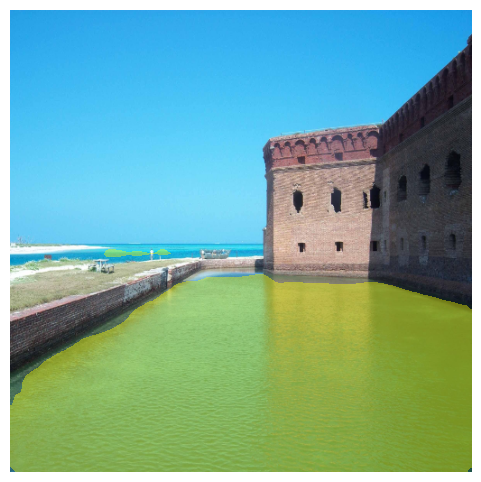

Epoch 9/30
1/1 [==============================] - 0s 32ms/step


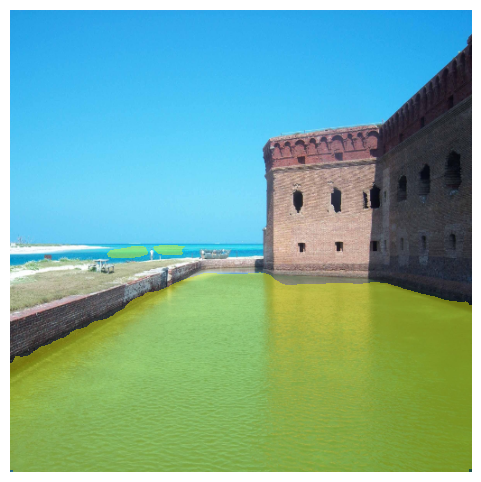

Epoch 10/30
1/1 [==============================] - 0s 31ms/step


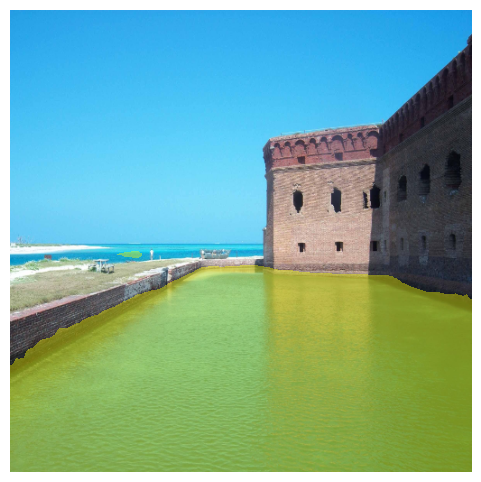

Epoch 11/30
1/1 [==============================] - 0s 31ms/step


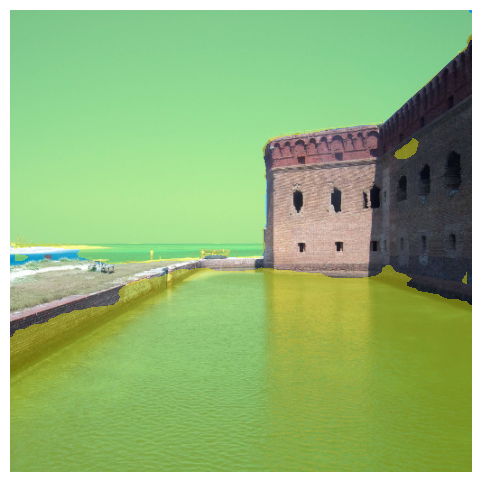

Epoch 12/30
1/1 [==============================] - 0s 34ms/step


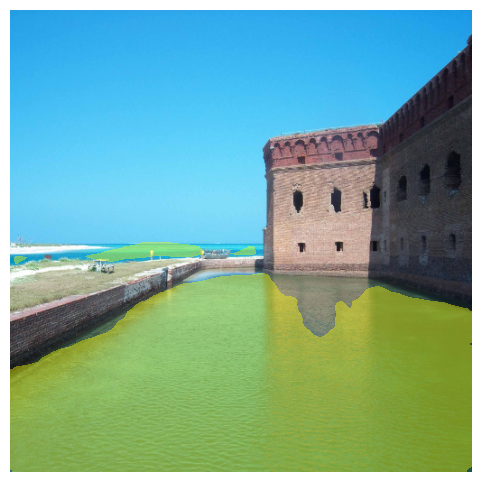

Epoch 13/30
1/1 [==============================] - 0s 47ms/step


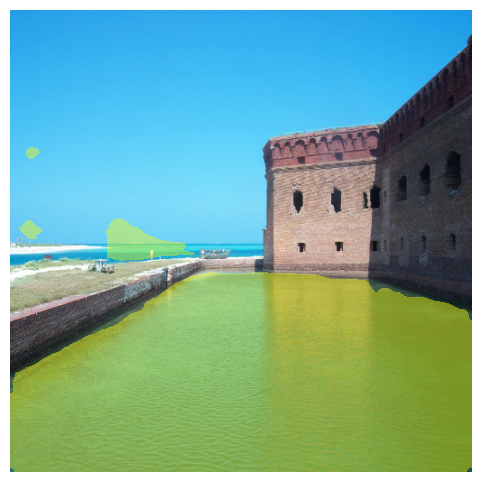

Epoch 14/30
1/1 [==============================] - 0s 31ms/step


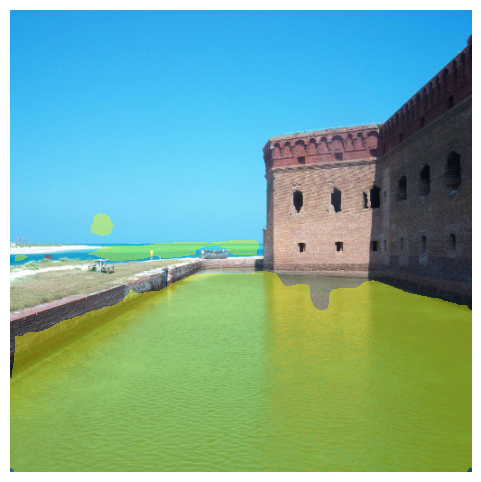

Epoch 15/30
1/1 [==============================] - 0s 30ms/step


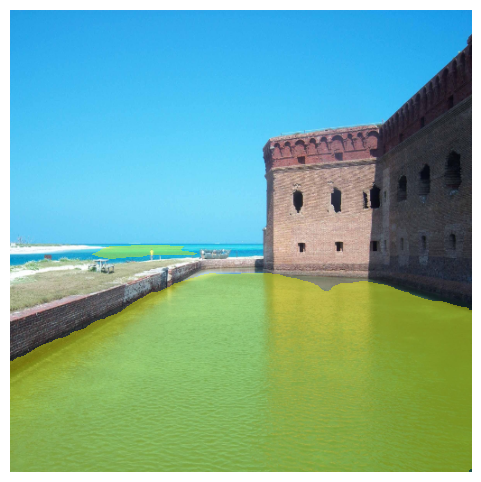

Epoch 16/30
1/1 [==============================] - 0s 31ms/step


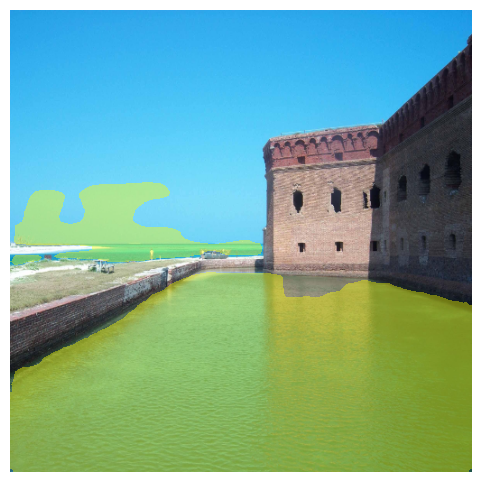

Epoch 17/30
1/1 [==============================] - 0s 32ms/step


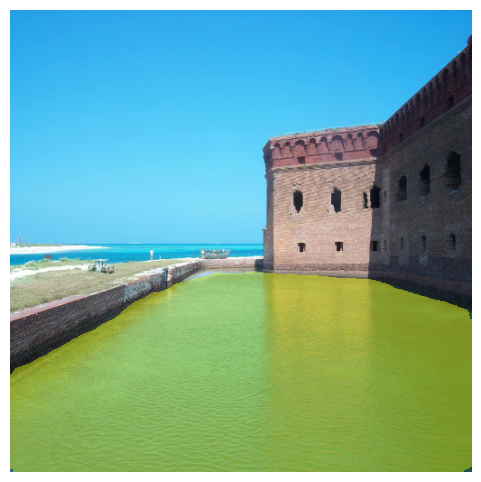

Epoch 18/30
1/1 [==============================] - 0s 49ms/step


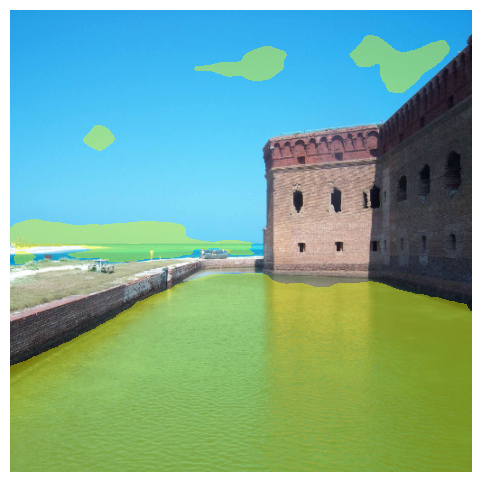

Epoch 19/30
1/1 [==============================] - 0s 32ms/step


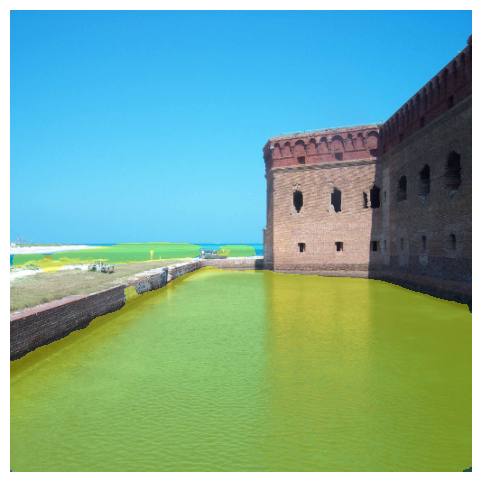

Epoch 20/30
1/1 [==============================] - 0s 31ms/step


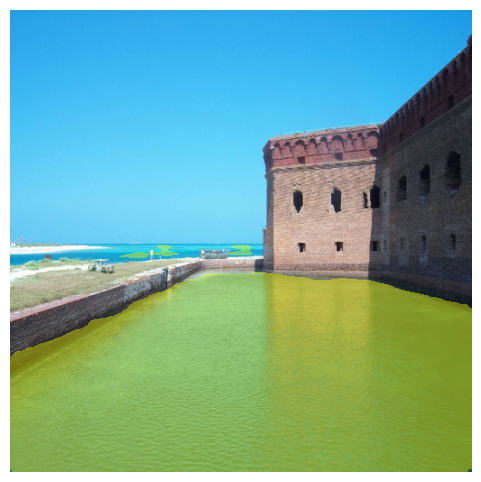

Epoch 21/30
1/1 [==============================] - 0s 31ms/step


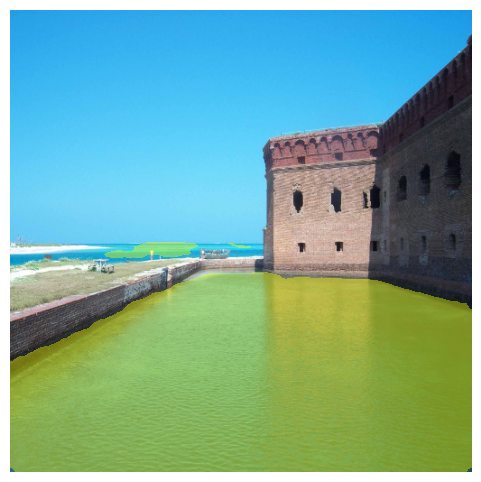

Epoch 22/30
1/1 [==============================] - 0s 33ms/step


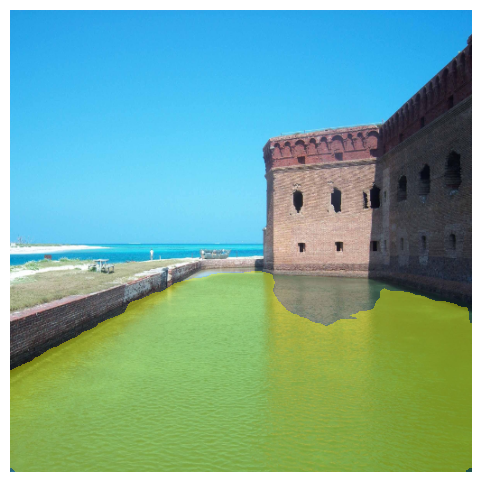

Epoch 23/30
1/1 [==============================] - 0s 31ms/step


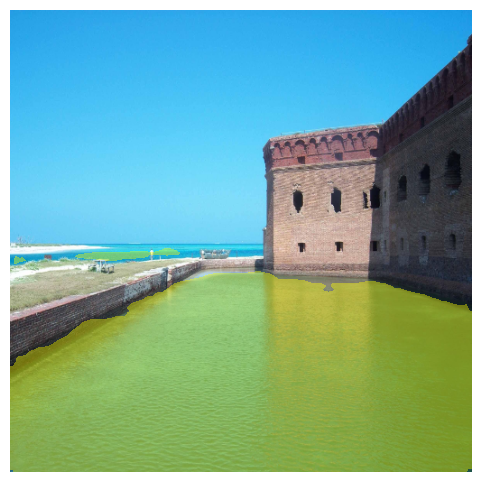

Epoch 24/30
1/1 [==============================] - 0s 33ms/step


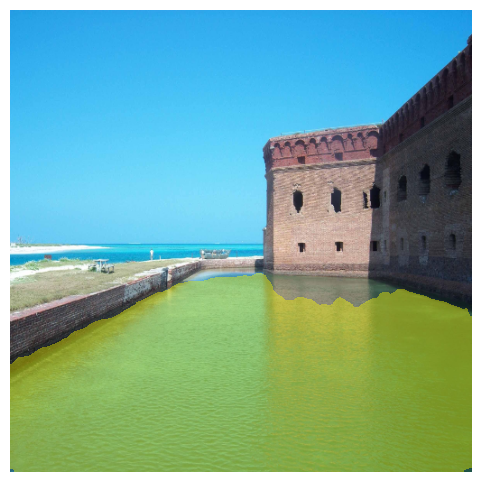

Epoch 25/30
1/1 [==============================] - 0s 33ms/step


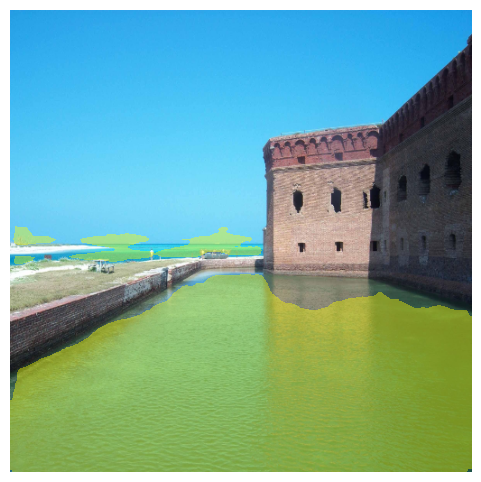

Epoch 26/30
1/1 [==============================] - 0s 32ms/step


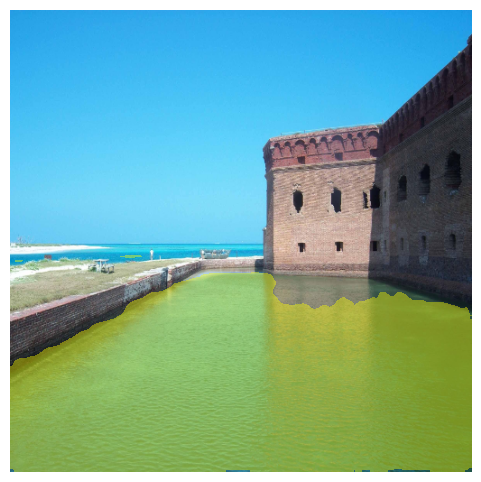

Epoch 27/30
1/1 [==============================] - 0s 33ms/step


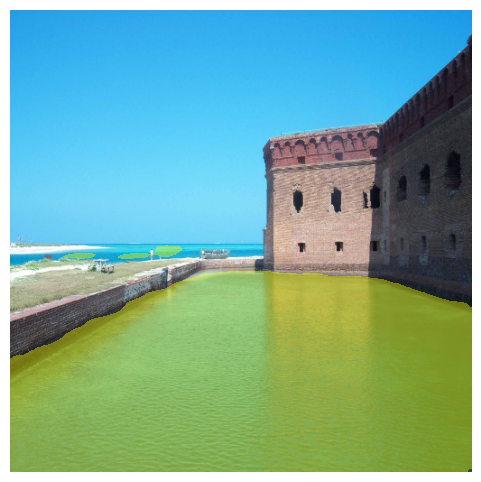

Epoch 28/30
1/1 [==============================] - 0s 34ms/step


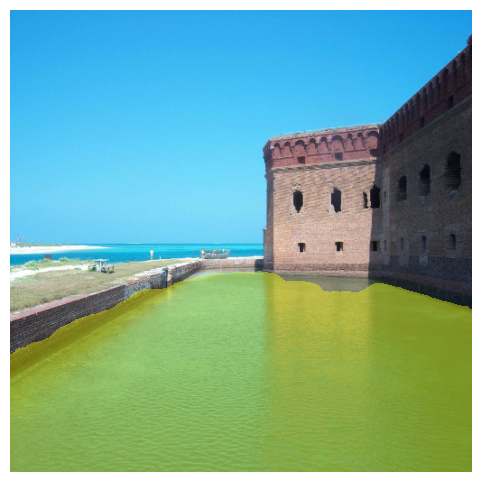

Epoch 29/30
1/1 [==============================] - 0s 46ms/step


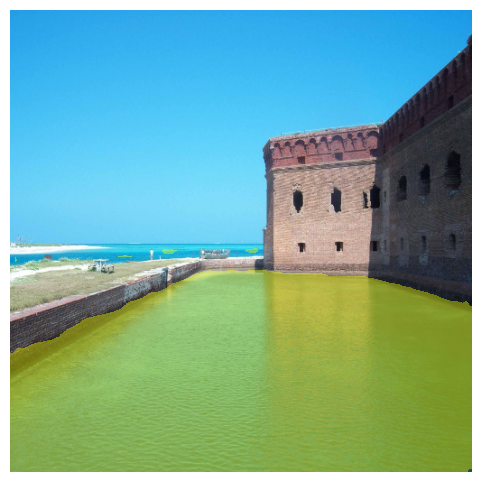

Epoch 30/30
382/382 [==============================] - 153s 400ms/step - loss: 0.1242 - accuracy: 0.9511 - val_loss: 0.2464 - val_accuracy: 0.9056


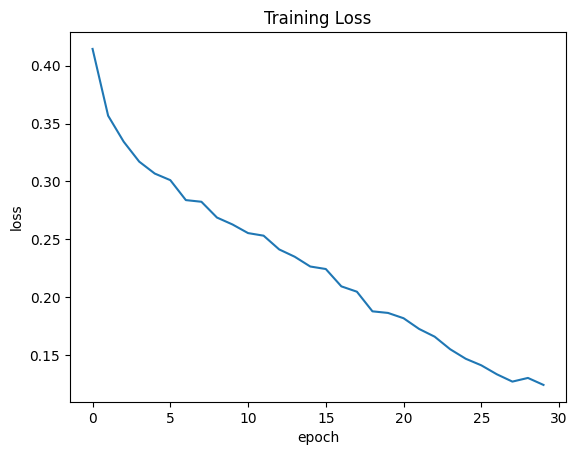

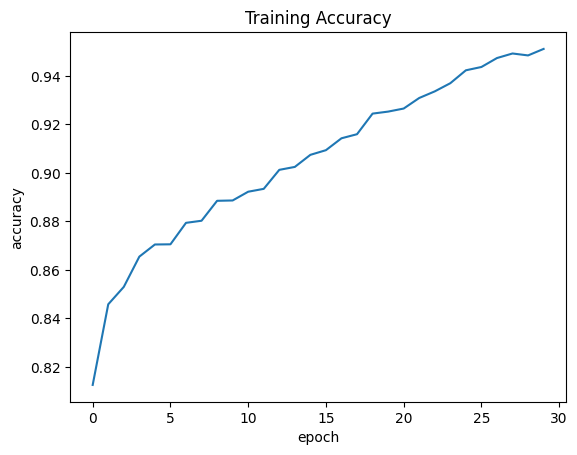

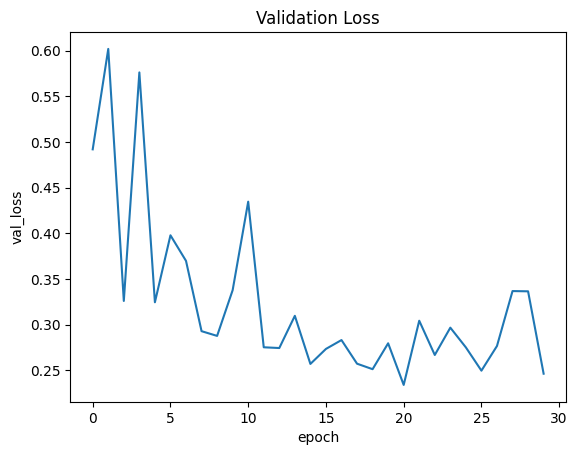

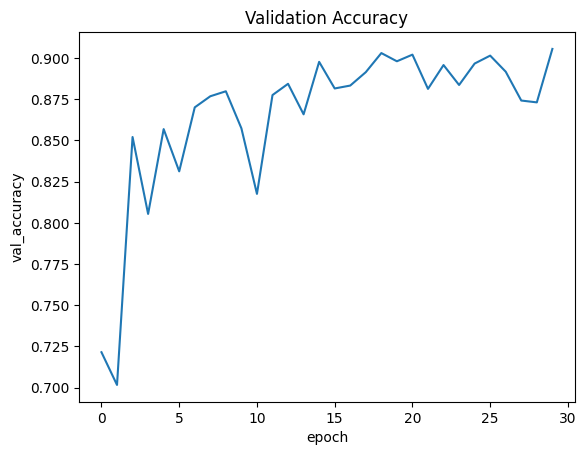

In [ ]:
EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
          show_prediction(sample_image)

loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=loss,
    metrics=["accuracy"],
)


history = model.fit(train_dataset, steps_per_epoch=STEPS_PER_EPOCH,
validation_data=valid_dataset, epochs=EPOCHS, callbacks=[DisplayCallback()])

plt.plot(history.history["loss"])
plt.title("Training Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["accuracy"])
plt.title("Training Accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_loss"])
plt.title("Validation Loss")
plt.ylabel("val_loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_accuracy"])
plt.title("Validation Accuracy")
plt.ylabel("val_accuracy")
plt.xlabel("epoch")
plt.show()



In [ ]:
from tensorflow.keras.models import load_model
model.save("/content/MyDrive/results/wtr_segmentation.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
